# Neural Style Transfer

This notebook contains the code for stylizing any image. For training the model check the `neural-style-transfer.ipynb` notebook from the [GitHub repo](https://github.com/Dilpreet-singh-13/neural_style_transfer).

**Time to style a single image:** (Depends on the image size)
- GPU : ~5-10 sec
- CPU : ~50-60 sec

Follow the instructions given and run each cell.

In [1]:
import torch
from torchvision import transforms
from PIL import Image
import numpy as np
import torch.nn as nn
from torchvision import models

1. **Upload the image to style and model weights to colab/kaggle/any platform you are using.**
2. **Change the below paths as needed**
- `INFERENCE_IMG_PATH`: input image path
- `MODEL_PATH`: pre trained model weights (`.pth` file)
- `OUTPUT_PATH`: path to save the final styled image

In [2]:
# path configs
INFERENCE_IMG_PATH = "/content/city_photo.jpg" # input image
MODEL_PATH = "/content/transformer_weight_final.pth" # pre-trained model weights
OUTPUT_PATH = "/content/stylized_img.jpg" # path to save styled image

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

**⚠️ Do not make any changes from this point**, just run each cell.

In [3]:
class ConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, norm="instance"):
        super(ConvLayer, self).__init__()
        padding_size = kernel_size // 2
        self.reflection_pad = nn.ReflectionPad2d(padding_size)

        self.conv_layer = nn.Conv2d(in_channels, out_channels, kernel_size, stride)

        self.norm_type = norm
        if norm == "instance":
            self.norm_layer = nn.InstanceNorm2d(out_channels, affine=True)
        elif norm == "batch":
            self.norm_layer = nn.BatchNorm2d(out_channels, affine=True)

    def forward(self, x):
        x = self.reflection_pad(x)
        x = self.conv_layer(x)
        if self.norm_type == "None":
            out = x
        else:
            out = self.norm_layer(x)
        return out


class ResidualLayer(nn.Module):
    def __init__(self, channels=128, kernel_size=3):
        super(ResidualLayer, self).__init__()
        self.conv1 = ConvLayer(channels, channels, kernel_size, stride=1)
        self.relu = nn.ReLU()
        self.conv2 = ConvLayer(channels, channels, kernel_size, stride=1)

    def forward(self, x):
        identity = x
        out = self.relu(self.conv1(x))
        out = self.conv2(out)
        out = out + identity
        return out


class DeconvLayer(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size,
        stride,
        output_padding,
        norm="instance",
    ):
        super(DeconvLayer, self).__init__()

        padding_size = kernel_size // 2
        self.conv_transpose = nn.ConvTranspose2d(
            in_channels, out_channels, kernel_size, stride, padding_size, output_padding
        )

        self.norm_type = norm
        if norm == "instance":
            self.norm_layer = nn.InstanceNorm2d(out_channels, affine=True)
        elif norm == "batch":
            self.norm_layer = nn.BatchNorm2d(out_channels, affine=True)

    def forward(self, x):
        x = self.conv_transpose(x)
        if self.norm_type == "None":
            out = x
        else:
            out = self.norm_layer(x)
        return out


class TransformerNetwork(nn.Module):
    def __init__(self):
        super(TransformerNetwork, self).__init__()
        self.ConvBlock = nn.Sequential(
            ConvLayer(3, 32, 9, 1),
            nn.ReLU(),
            ConvLayer(32, 64, 3, 2),
            nn.ReLU(),
            ConvLayer(64, 128, 3, 2),
            nn.ReLU(),
        )
        self.ResidualBlock = nn.Sequential(
            ResidualLayer(128, 3),
            ResidualLayer(128, 3),
            ResidualLayer(128, 3),
            ResidualLayer(128, 3),
            ResidualLayer(128, 3),
        )
        self.DeconvBlock = nn.Sequential(
            DeconvLayer(128, 64, 3, 2, 1),
            nn.ReLU(),
            DeconvLayer(64, 32, 3, 2, 1),
            nn.ReLU(),
            ConvLayer(32, 3, 9, 1, norm="None"),
        )

    def forward(self, x):
        x = self.ConvBlock(x)
        x = self.ResidualBlock(x)
        out = self.DeconvBlock(x)
        return out

In [4]:
def stylize_image(model_path, input_image_path, output_path):
    """Apply style transfer to a single image"""
    transform_net = TransformerNetwork().to(DEVICE)
    transform_net.load_state_dict(torch.load(model_path, map_location=DEVICE))
    transform_net.eval()

    inference_transform = transforms.Compose(
        [transforms.ToTensor(), transforms.Lambda(lambda x: x.mul(255))]
    )

    img = Image.open(input_image_path).convert("RGB")
    original_size = img.size
    img_tensor = inference_transform(img).unsqueeze(0)

    img_tensor = img_tensor[:, [2, 1, 0]].to(DEVICE)

    with torch.no_grad():
        stylized = transform_net(img_tensor)

    stylized = stylized[:, [2, 1, 0]].squeeze(0).cpu().numpy()
    stylized = stylized.transpose(1, 2, 0)
    stylized = np.clip(stylized, 0, 255).astype(np.uint8)

    stylized_pil = Image.fromarray(stylized)
    stylized_pil = stylized_pil.resize(original_size, Image.BICUBIC)
    stylized_pil.save(output_path)
    print(f"Stylized image saved to {output_path}")

    return stylized_pil

Stylized image saved to /content/stylized_img.jpg


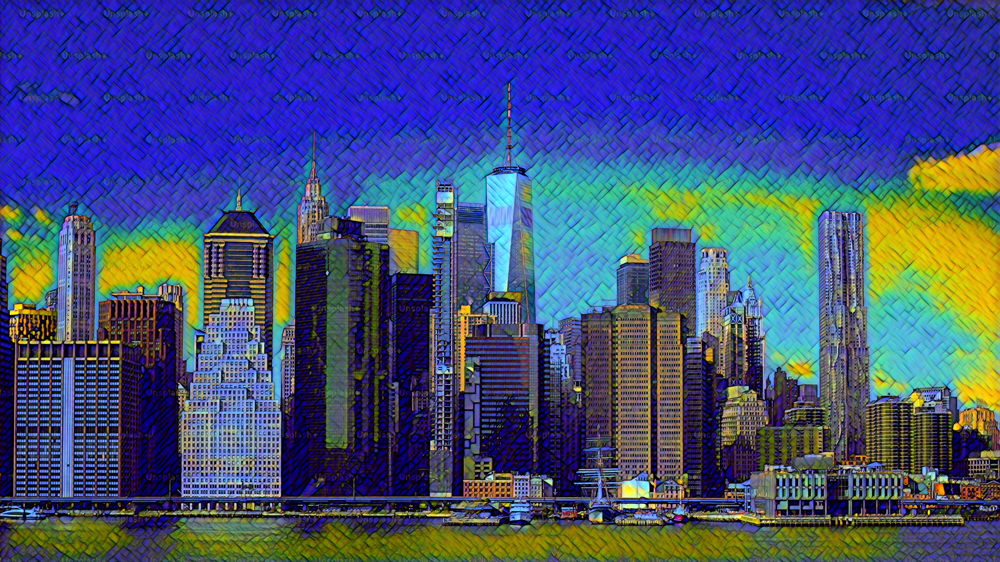

In [5]:
stylize_image(
        model_path=MODEL_PATH,
        input_image_path=INFERENCE_IMG_PATH,
        output_path=OUTPUT_PATH,
    )